In [ ]:
#pip install opencv-python

In [ ]:
#pip install tensorflow-directml

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import layers, datasets, models
from keras.utils import image_dataset_from_directory
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory
import matplotlib as plt
import matplotlib.pyplot as plt
from scipy import misc
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import os, shutil, pathlib
import cv2
import absl.logging
import seaborn as sns

C:\Users\Luke\AppData\Local\Temp\ipykernel_12180\305313350.py:11: DeprecationWarning: scipy.misc is deprecated and will be removed in 2.0.0
  from scipy import misc


# Luke Bradfield - MLA - Assignment - Image Data

In [3]:
# Loading the dataset folder downloaded. Tran, Test and Val folders merged into one.
original_dir = pathlib.Path("fruit_image_dataset")

In [5]:
# Creating new folder with processed images from original dataset.
new_base_dir = pathlib.Path("organized_fruit_dataset")

In [7]:
# All the fruits in the dataset assigned to categories.
categories = ["apple", "banana", "beetroot", "bell pepper", "cabbage", "capsicum", "carrot",
              "cauliflower", "chilli pepper", "corn", "cucumber", "eggplant", "garlic",
              "ginger", "grapes", "jalepeno", "kiwi", "lemon", "lettuce", "mango", "onion",
              "orange", "paprika", "pear", "peas", "pineapple", "pomegranate", "potato",
              "raddish", "soy beans", "spinach", "sweetcorn", "sweetpotato", "tomato",
              "turnip", "watermelon"]

fruit_image_dataset\apple\Image_1.jpg


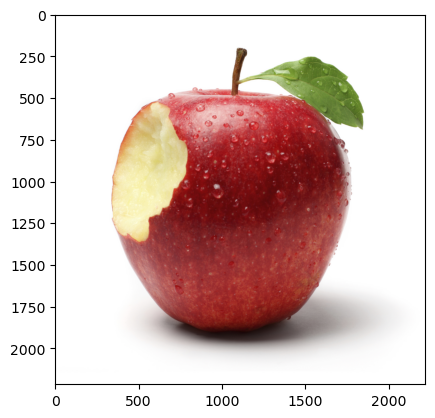

fruit_image_dataset\banana\Image_1.jpg


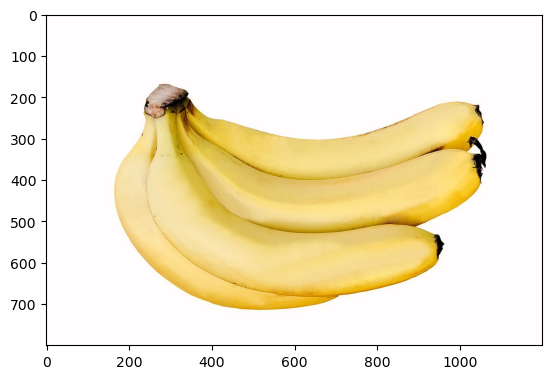

fruit_image_dataset\beetroot\Image_1.jpg


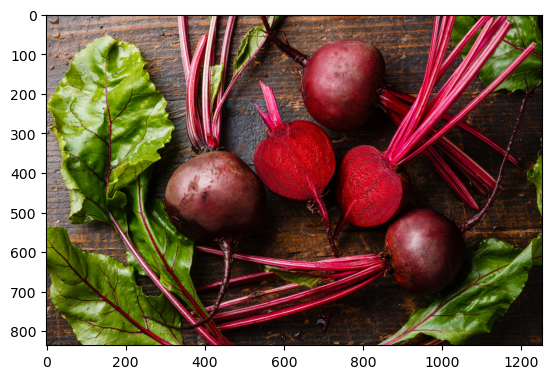

fruit_image_dataset\bell pepper\Image_1.jpg


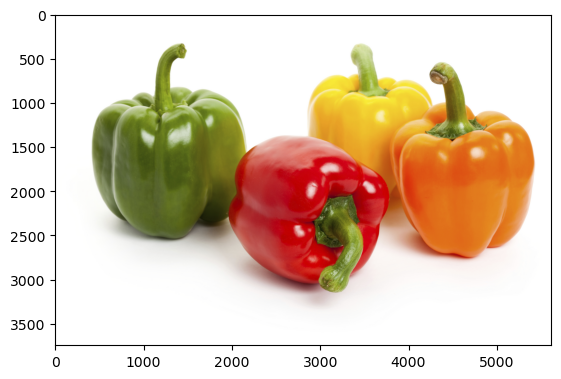

fruit_image_dataset\cabbage\Image_1.jpg


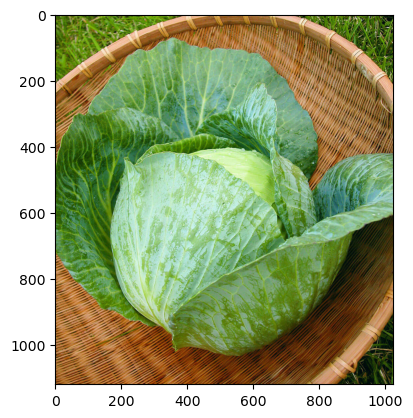

fruit_image_dataset\capsicum\Image_1.jpg


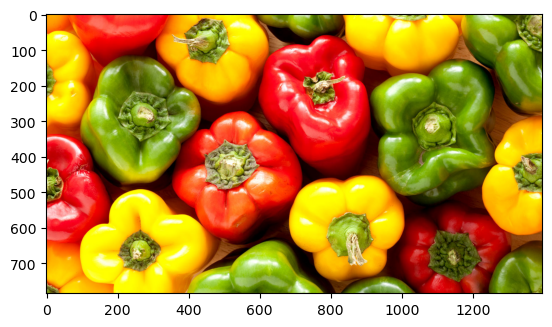

fruit_image_dataset\carrot\Image_1.jpg


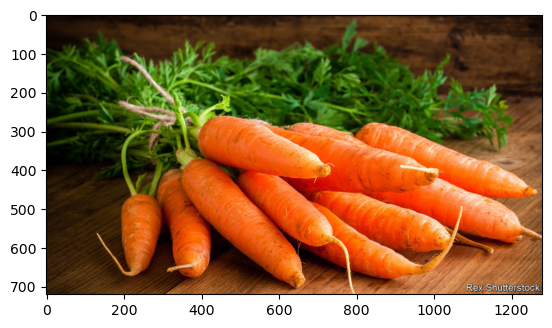

fruit_image_dataset\cauliflower\Image_1.jpg


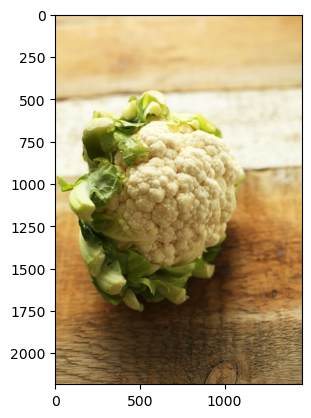

fruit_image_dataset\chilli pepper\Image_1.jpg


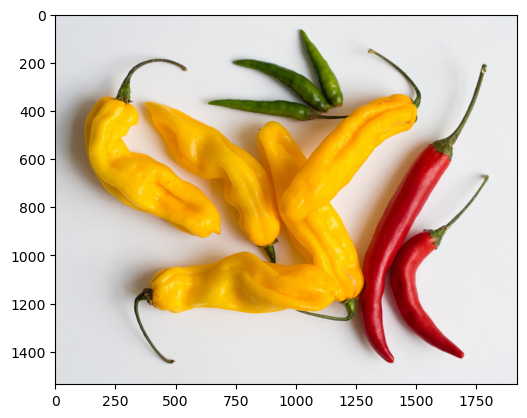

fruit_image_dataset\corn\Image_1.jpg


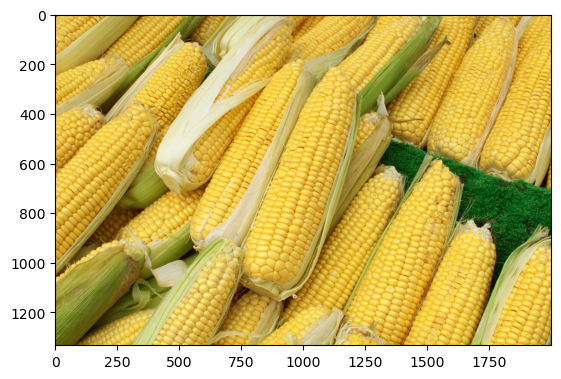

fruit_image_dataset\cucumber\Image_1.jpg


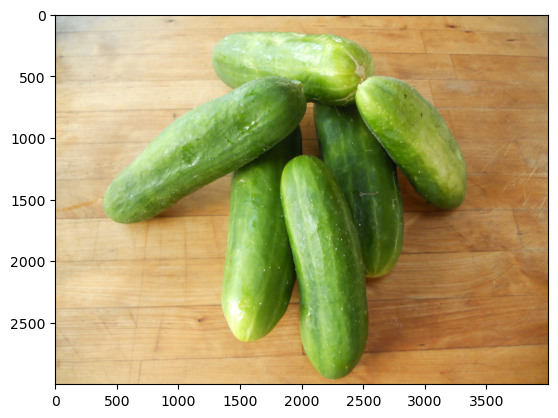

fruit_image_dataset\eggplant\Image_1.jpg


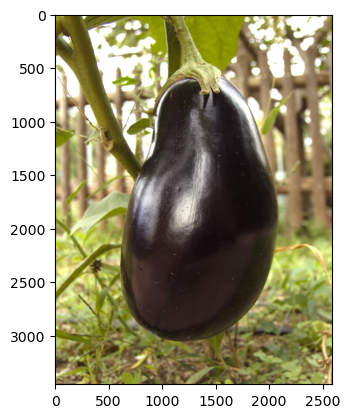

fruit_image_dataset\garlic\Image_1.jpg


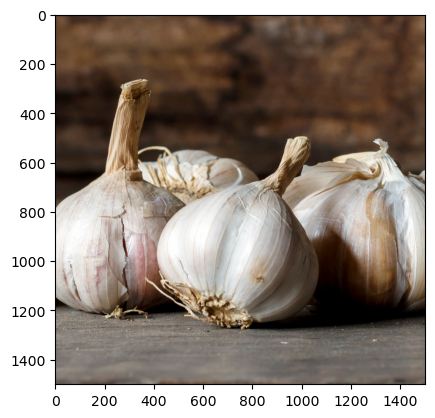

fruit_image_dataset\ginger\Image_1.jpg


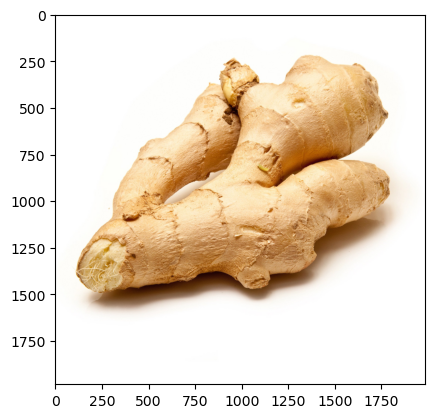

fruit_image_dataset\grapes\Image_1.jpg


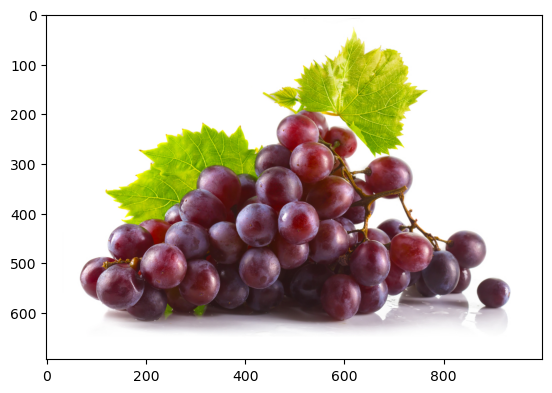

fruit_image_dataset\jalepeno\Image_1.jpeg


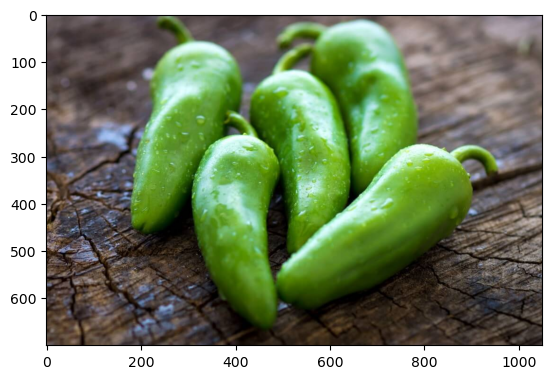

fruit_image_dataset\kiwi\Image_1.jpg


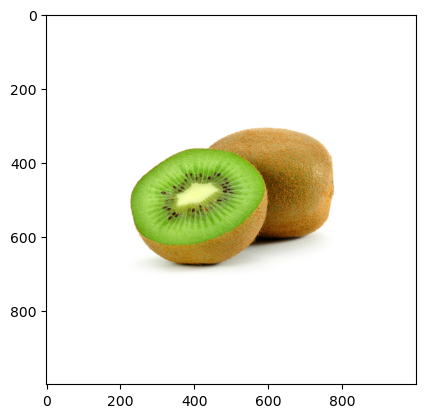

fruit_image_dataset\lemon\Image_1.png


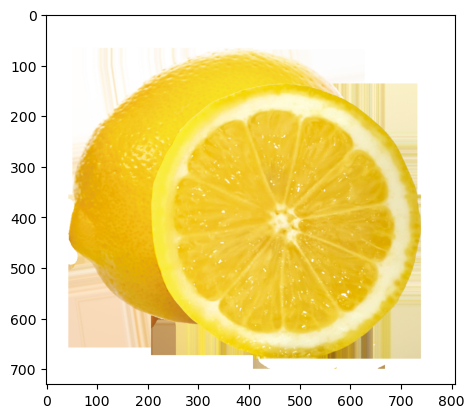

fruit_image_dataset\lettuce\Image_1.jpg


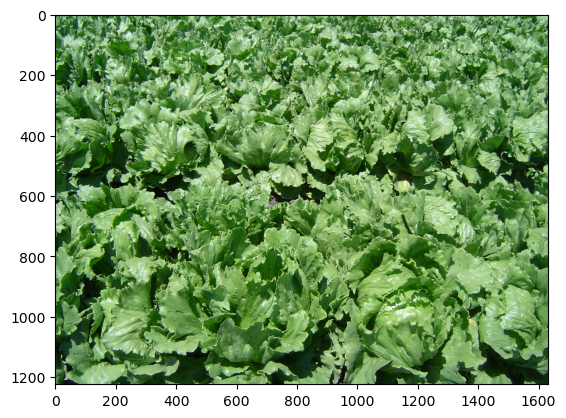

fruit_image_dataset\mango\Image_1.jpg


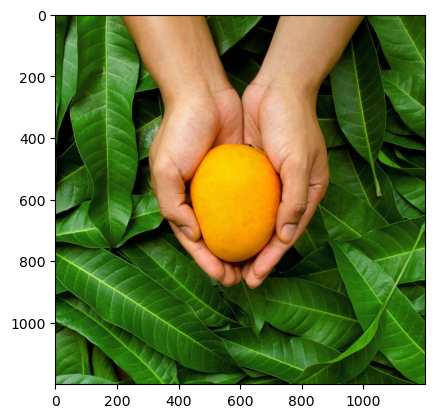

fruit_image_dataset\onion\Image_1.jpg


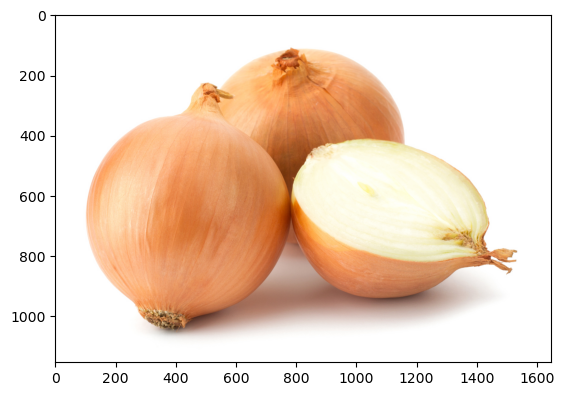

fruit_image_dataset\orange\Image_1.png


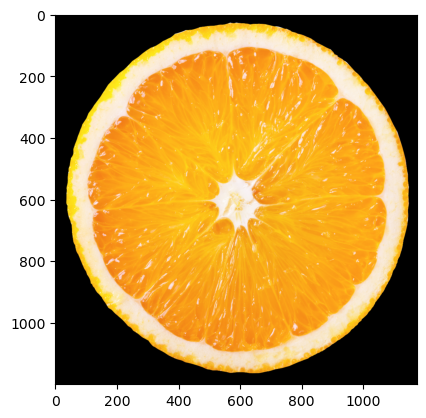

fruit_image_dataset\paprika\Image_1.jpg


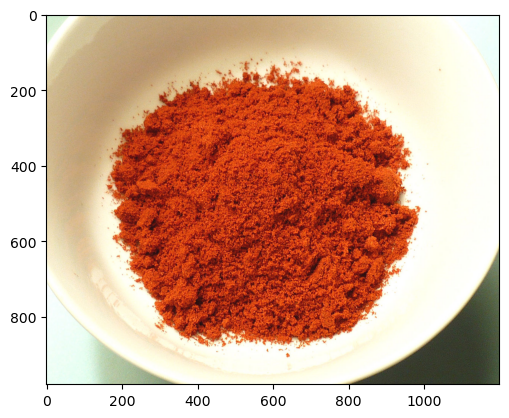

fruit_image_dataset\pear\Image_1.jpg


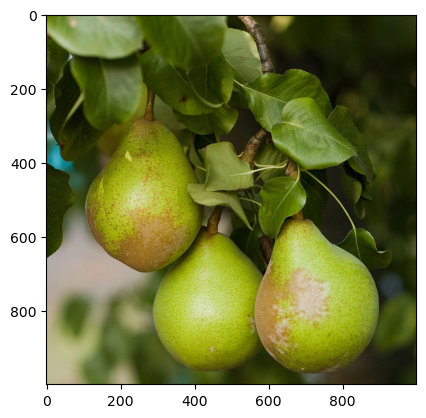

fruit_image_dataset\peas\Image_1.jpg


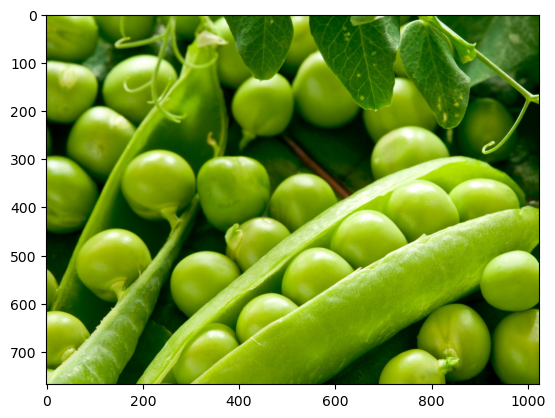

fruit_image_dataset\pineapple\Image_1.jpg


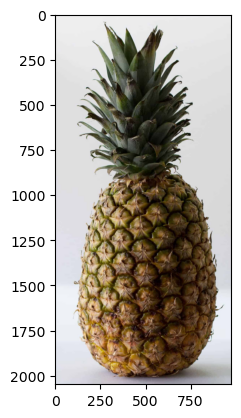

fruit_image_dataset\pomegranate\Image_1.jpg


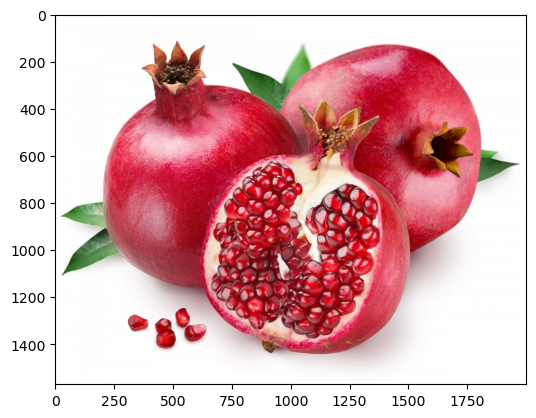

fruit_image_dataset\potato\Image_1.jpg


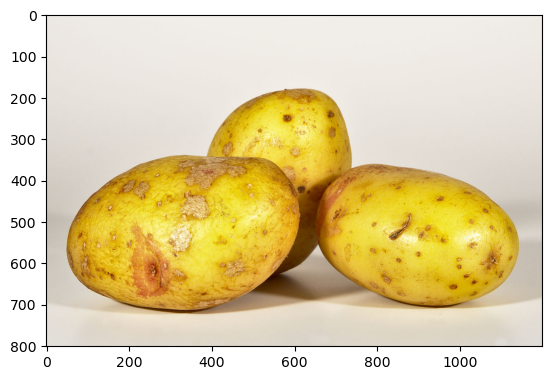

fruit_image_dataset\raddish\Image_1.jpg


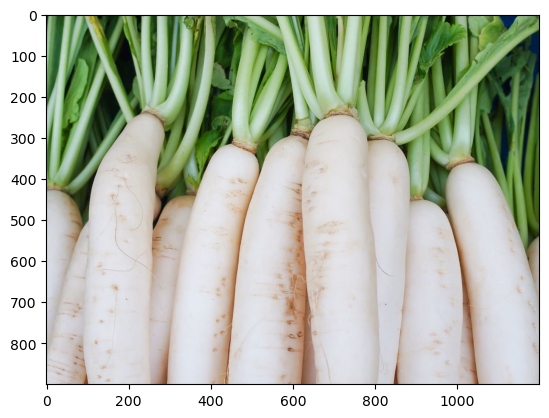

fruit_image_dataset\soy beans\Image_1.jpg


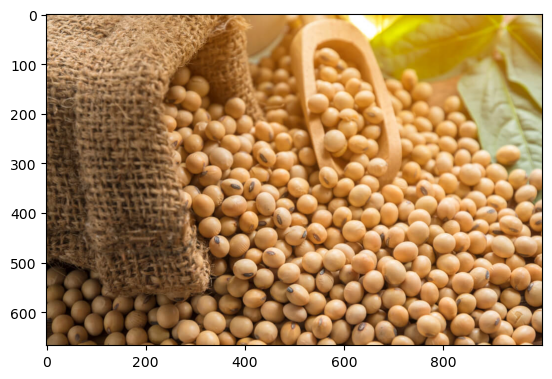

fruit_image_dataset\spinach\Image_1.jpg


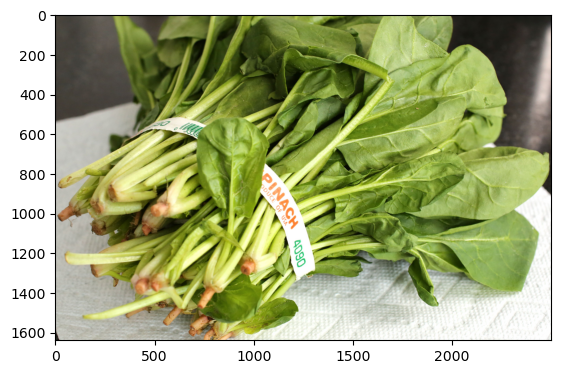

fruit_image_dataset\sweetcorn\Image_1.jpg


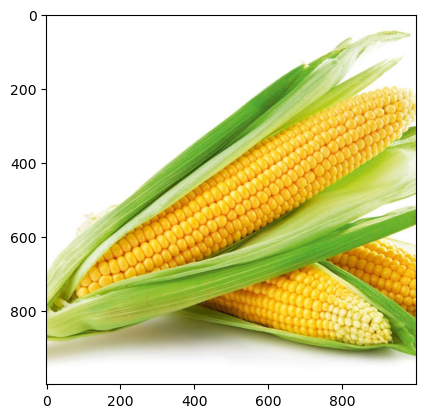

fruit_image_dataset\sweetpotato\Image_1.jpg


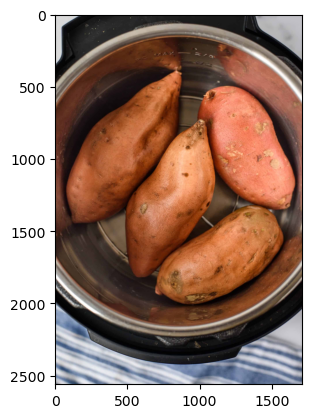

fruit_image_dataset\tomato\Image_1.jpg


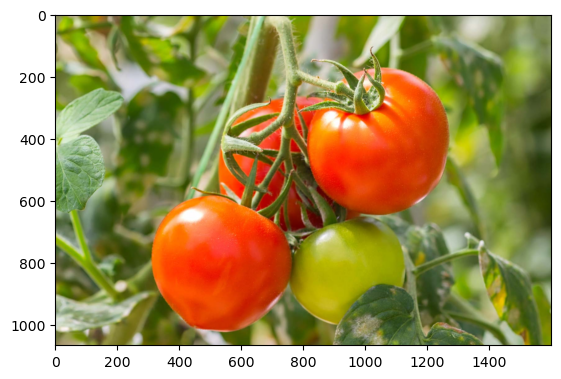

fruit_image_dataset\turnip\Image_1.jpg


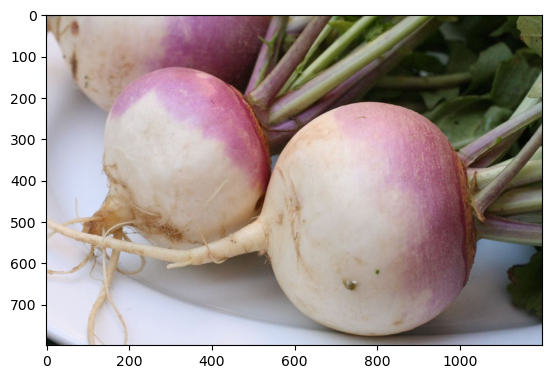

fruit_image_dataset\watermelon\Image_1.jpg


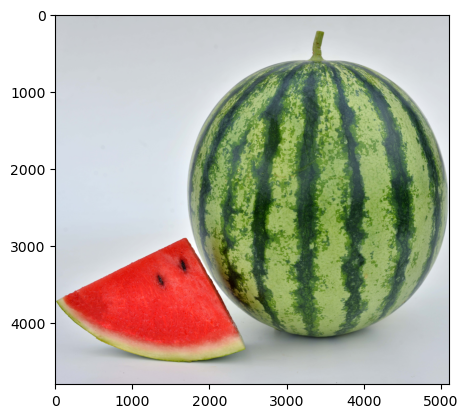

In [9]:
# Simple loading in the dataset to test.
# Image shows blue due to the way cv2 displays colour.
for category in categories:
        path = os.path.join(original_dir, category)
        for img in os.listdir(path):
            path = original_dir / category
            img_path = path / img
            cv2.imread(str(img_path))
            print(img_path)
            img_array = cv2.imread(str(img_path))
            if img_array is None:
                print("Failed to load image!")
            else:
                plt.imshow(cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB))
                plt.show()
            break

In [10]:
print(img_array)

[[[205 200 197]
  [205 200 197]
  [205 200 197]
  ...
  [208 203 200]
  [208 203 200]
  [208 203 200]]

 [[205 200 197]
  [205 200 197]
  [205 200 197]
  ...
  [208 203 200]
  [208 203 200]
  [208 203 200]]

 [[205 200 197]
  [205 200 197]
  [205 200 197]
  ...
  [208 203 200]
  [208 203 200]
  [208 203 200]]

 ...

 [[217 204 202]
  [217 204 202]
  [217 204 202]
  ...
  [217 208 204]
  [217 208 204]
  [218 209 205]]

 [[217 204 202]
  [217 204 202]
  [217 204 202]
  ...
  [217 208 204]
  [217 208 204]
  [218 209 205]]

 [[217 204 202]
  [217 204 202]
  [217 204 202]
  ...
  [217 208 204]
  [217 208 204]
  [218 209 205]]]


In [13]:
# Displaying image dataset size.
# (height, width, channels)
print(img_array.shape)

(4795, 5114, 3)


In [17]:
# Here, we implement a function for splitting the dataset into two subfolders containing each class
# This function also divides the dataset into training, validation and test sets
# Taking into account file names.
def create_subset(subset_name, start_index, end_index):
    for category in categories:
        category_dir = original_dir / category
        target_dir = new_base_dir / subset_name / category
        os.makedirs(target_dir, exist_ok=True)
        # List all image files
        image_files = list(category_dir.glob("*.jpg")) + \
            list(category_dir.glob("*.jpeg")) + \
            list(category_dir.glob("*.png"))
        # Slice only the required range
        selected_images = image_files[start_index:end_index]
        for img_path in selected_images:
            dst = target_dir / img_path.name
            shutil.copyfile(img_path, dst)

In [19]:
create_subset("train", start_index=0,end_index = 35)
create_subset("validation", start_index=35,end_index = 45)
create_subset("test", start_index=45,end_index = 50)

# Data preprocessing

In [21]:
# Using keras' image_dataset_from_directory function to read images from prepared images from the directory.
train_dataset = image_dataset_from_directory(
    new_base_dir/"train",image_size=(256,256), batch_size=64)
validation_dataset = image_dataset_from_directory(
    new_base_dir/"validation",image_size=(256,256), batch_size=64)
test_dataset = image_dataset_from_directory(
    new_base_dir/"test",image_size=(256,256), batch_size=64)

Found 1260 files belonging to 36 classes.
Found 360 files belonging to 36 classes.
Found 180 files belonging to 36 classes.


In [23]:
# Building the CNN architecture for the model.
inputs = keras.Input(shape = (256, 256,3))
x = layers.Rescaling(1./255)(inputs)
x = layers.Conv2D(filters=32, kernel_size = 3, strides = (1,1), activation ="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size = 3,strides = (1,1), activation ="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size = 3,strides = (1,1), activation ="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size = 3,strides = (1,1), activation ="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size = 3,strides = (1,1), activation ="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Flatten()(x)
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(len(categories), activation="softmax")(x)
model = keras.Model(inputs=inputs,outputs = outputs)

In [25]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                         

In [27]:
type(train_dataset)

tensorflow.python.data.ops.dataset_ops.BatchDataset

In [29]:
# Compile the model with appropriate parameters.
model.compile(loss="sparse_categorical_crossentropy",optimizer="adam",metrics=["accuracy"])

In [31]:
callbacks = [keras.callbacks.ModelCheckpoint(filepath="convnet_from_scratch.keras", save_best_only=True, monitor ="val_loss")]

In [33]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

In [35]:
# Training the model
with tf.device("/GPU:0"):
    history = model.fit(train_dataset, epochs=50, validation_data = validation_dataset, callbacks = callbacks)

Epoch 1/50
20/20 [==============================] - 18s 780ms/step - loss: 3.5592 - accuracy: 0.0452 - val_loss: 3.4351 - val_accuracy: 0.0611
Epoch 2/50
20/20 [==============================] - 17s 758ms/step - loss: 3.3621 - accuracy: 0.0627 - val_loss: 3.2442 - val_accuracy: 0.0639
Epoch 3/50
20/20 [==============================] - 18s 793ms/step - loss: 3.2007 - accuracy: 0.0817 - val_loss: 3.0770 - val_accuracy: 0.1167
Epoch 4/50
20/20 [==============================] - 17s 777ms/step - loss: 2.9207 - accuracy: 0.1540 - val_loss: 2.8361 - val_accuracy: 0.1472
Epoch 5/50
20/20 [==============================] - 17s 784ms/step - loss: 2.6966 - accuracy: 0.1937 - val_loss: 2.7314 - val_accuracy: 0.2111
Epoch 6/50
20/20 [==============================] - 17s 777ms/step - loss: 2.4589 - accuracy: 0.2429 - val_loss: 2.7451 - val_accuracy: 0.2139
Epoch 7/50
20/20 [==============================] - 17s 762ms/step - loss: 2.2626 - accuracy: 0.3222 - val_loss: 2.7205 - val_accuracy: 0.1917

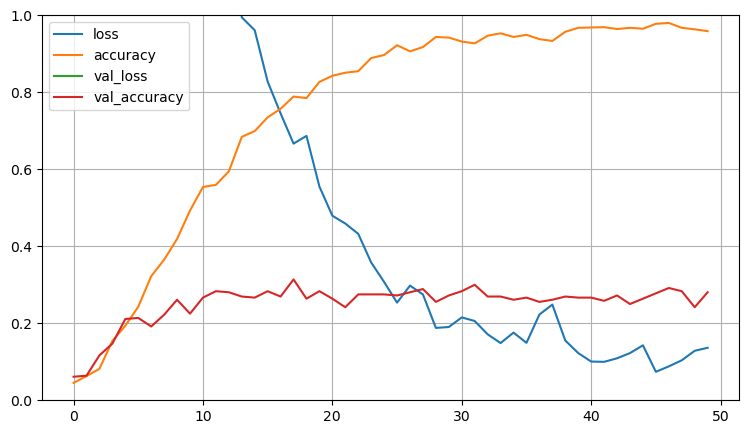

In [37]:
pd.DataFrame(history.history).plot(figsize=(9,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

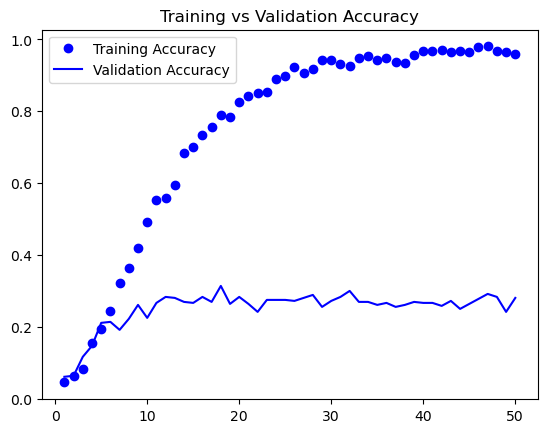

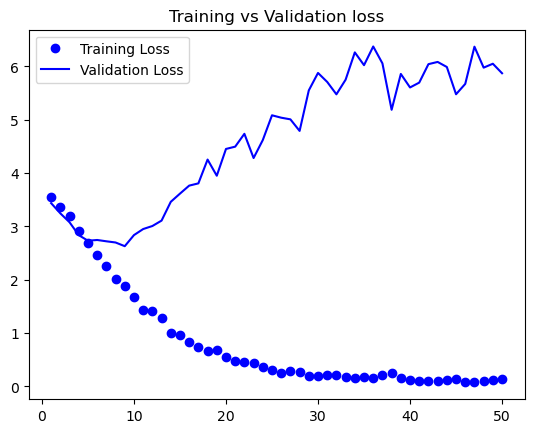

In [39]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1,len(accuracy)+ 1)
plt.plot(epochs, accuracy,"bo",label = "Training Accuracy")
plt.plot(epochs, val_accuracy,"b",label = "Validation Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss,"bo",label = "Training Loss")
plt.plot(epochs, val_loss,"b",label = "Validation Loss")
plt.title("Training vs Validation loss")
plt.legend()
plt.show()

In [41]:
# Testing the accuracy.
test_model = keras.models.load_model("convnet_from_scratch.keras")

In [43]:
test_loss, test_acc = test_model.evaluate(test_dataset)

3/3 [==============================] - 1s 141ms/step - loss: 2.3142 - accuracy: 0.3167


In [45]:
print(f"Test Accuracy:{test_acc:.3f}")

Test Accuracy:0.317


# Data Augmentation

In [47]:
for images, _ in train_dataset.take(1):
    print(images.dtype, images.shape, images[0].numpy().min(), images[0].numpy().max())

<dtype: 'float32'> (64, 256, 256, 3) 0.0 255.0


In [49]:
print(images.dtype, tf.reduce_max(images), tf.reduce_min(images))

<dtype: 'float32'> tf.Tensor(255.0, shape=(), dtype=float32) tf.Tensor(0.0, shape=(), dtype=float32)


In [51]:
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"), 
    layers.RandomRotation(0.1), 
    layers.RandomZoom(0.2),
], name="data_augmentation")
inputs = keras.Input(shape=(256, 256, 3))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)

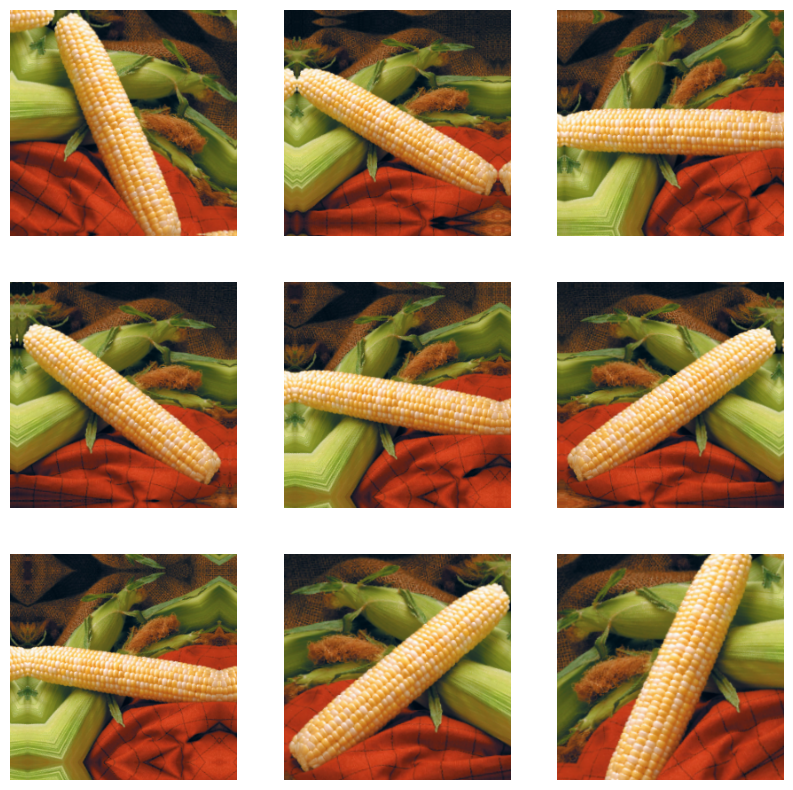

In [53]:
plt.figure(figsize=(10,10))
for images, _ in train_dataset.take(1):
    image = images[0:1]  # take a single image with batch dimension
    for i in range(9):
        augmented_image = data_augmentation(image, training=True)
        ax = plt.subplot(3,3, i+1)
        plt.imshow(augmented_image[0].numpy().astype("uint8"))
        plt.axis("off")
plt.show()

In [55]:
inputs = keras.Input(shape=(256, 256, 3))
x = data_augmentation(inputs) # Augmentation
x = layers.Rescaling(1./255)(x)# Normalization
x = layers.Conv2D(32, 3, activation="relu")(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(64, 3, activation="relu")(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(128, 3, activation="relu")(x)
x = layers.MaxPooling2D()(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)# Dropout
outputs = layers.Dense(36, activation="softmax")(x)

In [57]:
# Output the model's summary.
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                         

# Fitting the model

In [59]:
# Compile the model.
model = keras.Model(inputs, outputs)
model.compile(loss="sparse_categorical_crossentropy",optimizer="adam",metrics=["accuracy"])

In [61]:
# Callbacks
callbacks = [keras.callbacks.ModelCheckpoint(filepath="convnet_from_scratch.keras", save_best_only=True, monitor ="val_loss")]

In [63]:
history = model.fit(train_dataset, epochs=100,validation_data = validation_dataset, callbacks = callbacks)

Epoch 1/100
20/20 [==============================] - 16s 637ms/step - loss: 3.5663 - accuracy: 0.0532 - val_loss: 3.1835 - val_accuracy: 0.1139
Epoch 2/100
20/20 [==============================] - 14s 637ms/step - loss: 2.7642 - accuracy: 0.2063 - val_loss: 2.8910 - val_accuracy: 0.1861
Epoch 3/100
20/20 [==============================] - 14s 635ms/step - loss: 2.3715 - accuracy: 0.3087 - val_loss: 2.8296 - val_accuracy: 0.2194
Epoch 4/100
20/20 [==============================] - 14s 631ms/step - loss: 2.0754 - accuracy: 0.3730 - val_loss: 2.8716 - val_accuracy: 0.2472
Epoch 5/100
20/20 [==============================] - 15s 655ms/step - loss: 1.8683 - accuracy: 0.4262 - val_loss: 2.8392 - val_accuracy: 0.2556
Epoch 6/100
20/20 [==============================] - 14s 630ms/step - loss: 1.7838 - accuracy: 0.4563 - val_loss: 2.7454 - val_accuracy: 0.2861
Epoch 7/100
20/20 [==============================] - 15s 639ms/step - loss: 1.5934 - accuracy: 0.5127 - val_loss: 2.8603 - val_accuracy:

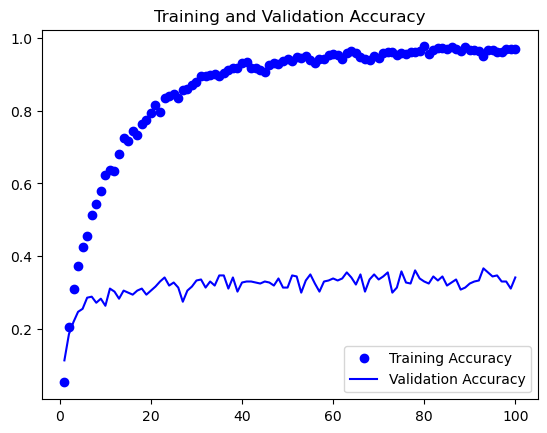

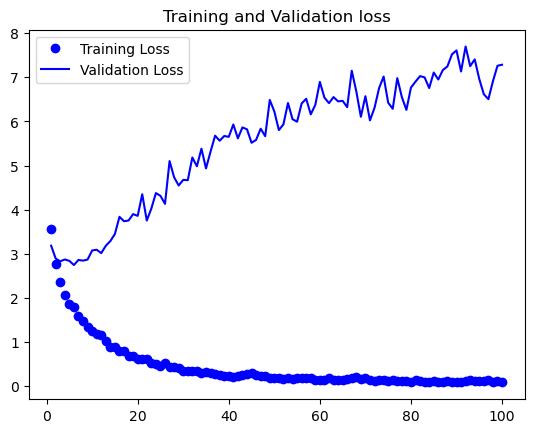

In [65]:
# Plot the Training vs Validation Accuracy.
# Plot the Training vs Validation Loss.
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1,len(accuracy)+ 1)
plt.plot(epochs, accuracy,"bo",label = "Training Accuracy")
plt.plot(epochs, val_accuracy,"b",label = "Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss,"bo",label = "Training Loss")
plt.plot(epochs, val_loss,"b",label = "Validation Loss")
plt.title("Training and Validation loss")
plt.legend()
plt.show()

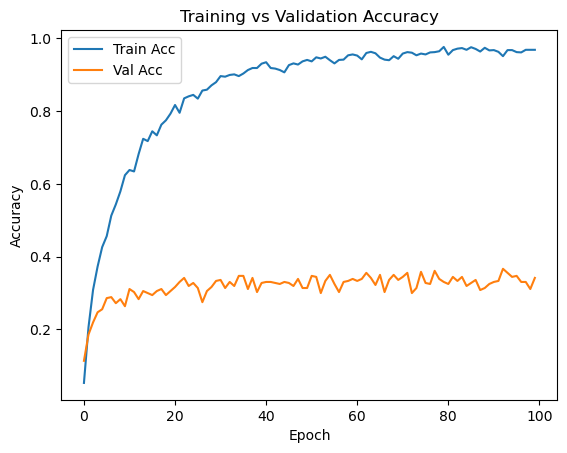

In [67]:
plt.plot(history.history["accuracy"], label="Train Acc")
plt.plot(history.history["val_accuracy"], label="Val Acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Training vs Validation Accuracy")
plt.show()

In [69]:
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

3/3 [==============================] - 1s 136ms/step - loss: 6.7993 - accuracy: 0.3722
Test Loss: 6.7993
Test Accuracy: 0.3722


In [71]:
# Get class names (optional, for better output)
class_names = test_dataset.class_names

# Unbatch the test dataset into NumPy arrays.
y_true = []
y_pred = []

for images, labels in test_dataset:
    preds = model.predict(images)
    preds_labels = np.argmax(preds, axis=1)
    y_pred.extend(preds_labels)
    y_true.extend(labels.numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

2/2 [==============================] - 0s 45ms/step


In [73]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

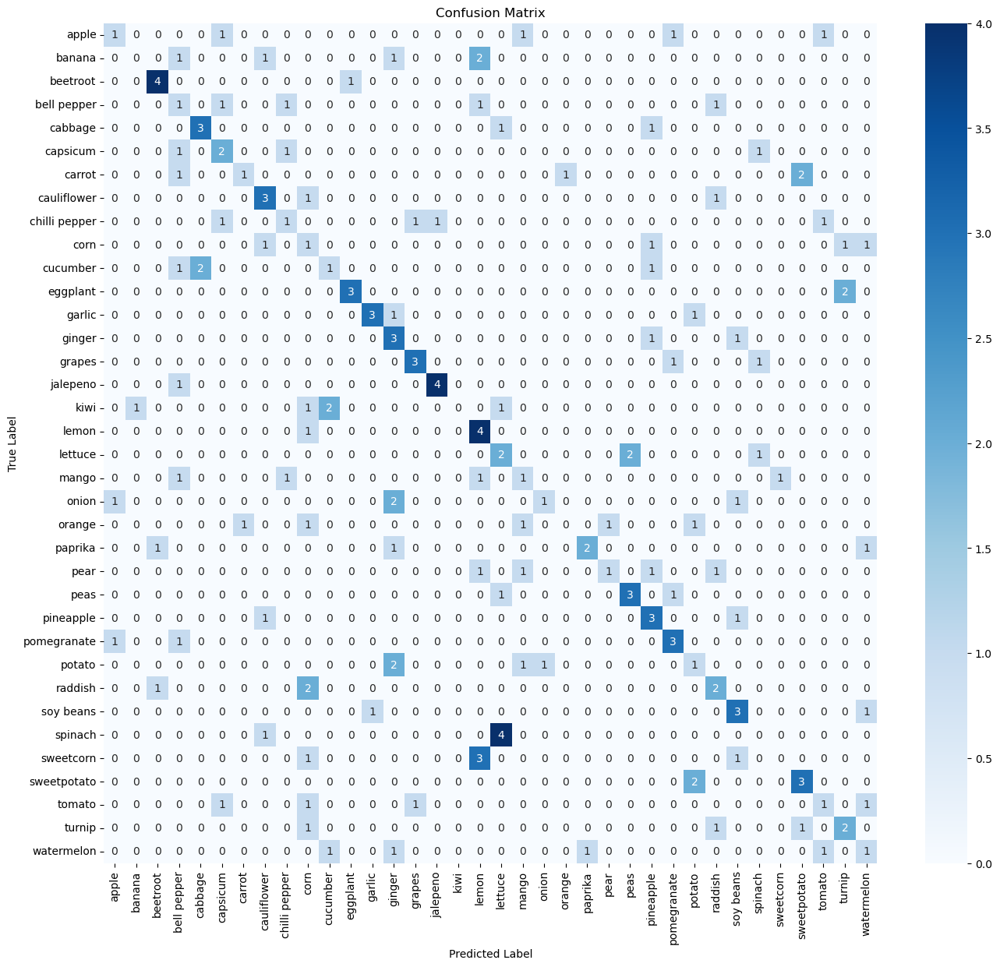

In [75]:
# Display confusion matrix.
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(16, 14))
sns.heatmap(cm, xticklabels=class_names, yticklabels=class_names, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [77]:
from sklearn.metrics import classification_report

In [79]:
# print classification report.
# Precision = correct positive predictions / all predicted positives.
# Recall = correct positive predictions / all actual positives.
# F1 Score = harmonic mean of precision and recall.

report = classification_report(y_true, y_pred, target_names=class_names, zero_division=0)
print(report)

               precision    recall  f1-score   support

        apple       0.33      0.20      0.25         5
       banana       0.00      0.00      0.00         5
     beetroot       0.67      0.80      0.73         5
  bell pepper       0.12      0.20      0.15         5
      cabbage       0.60      0.60      0.60         5
     capsicum       0.33      0.40      0.36         5
       carrot       0.50      0.20      0.29         5
  cauliflower       0.43      0.60      0.50         5
chilli pepper       0.25      0.20      0.22         5
         corn       0.10      0.20      0.13         5
     cucumber       0.25      0.20      0.22         5
     eggplant       0.75      0.60      0.67         5
       garlic       0.75      0.60      0.67         5
       ginger       0.27      0.60      0.38         5
       grapes       0.60      0.60      0.60         5
     jalepeno       0.80      0.80      0.80         5
         kiwi       0.00      0.00      0.00         5
        l

In [81]:
import random

2/2 [==============================] - 0s 54ms/step


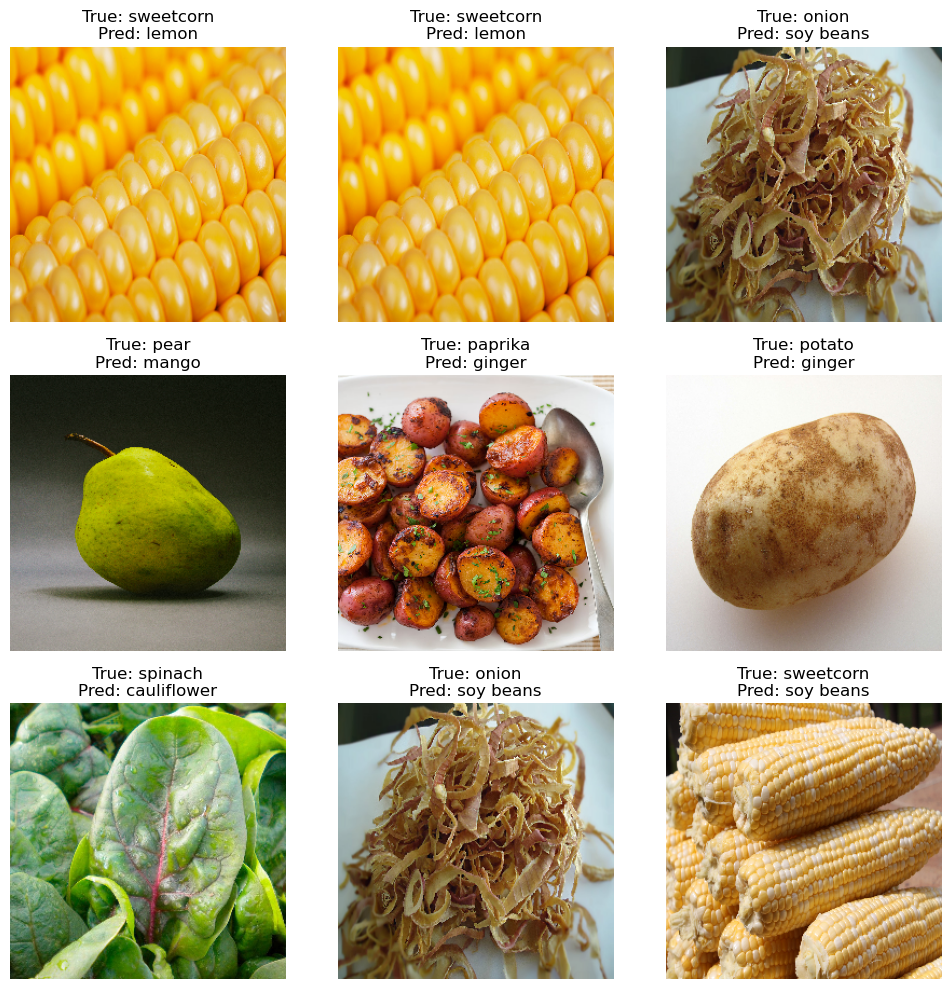

In [83]:
# Visualize Misclassified Images.

misclassified = []

for images, labels in test_dataset:
    preds = model.predict(images)
    pred_labels = np.argmax(preds, axis=1)
    for img, true, pred in zip(images, labels.numpy(), pred_labels):
        if true != pred:
            misclassified.append((img, true, pred))

# Show 9 misclassified images
plt.figure(figsize=(10, 10))
for i in range(9):
    img, true, pred = random.choice(misclassified)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(img.numpy().astype("uint8"))
    plt.title(f"True: {class_names[true]}\nPred: {class_names[pred]}")
    plt.axis("off")
plt.tight_layout()
plt.show()

# Pretrained Model

In [86]:
from tensorflow.keras.applications import VGG16

In [88]:
train_dataset = image_dataset_from_directory(
    new_base_dir / "train",
    image_size=(180, 180),  # Resize images here
    batch_size=64)

validation_dataset = image_dataset_from_directory(
    new_base_dir / "validation",
    image_size=(180, 180),
    batch_size=64)

test_dataset = image_dataset_from_directory(
    new_base_dir / "test",
    image_size=(180, 180),
    batch_size=64)

Found 1260 files belonging to 36 classes.
Found 360 files belonging to 36 classes.
Found 180 files belonging to 36 classes.


In [90]:
cnn_base = keras.applications.vgg16.VGG16(weights ="imagenet", include_top = False, input_shape=(180, 180, 3))

In [92]:
cnn_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [94]:
# First Process
def getFeatures_and_Labels(dataset):
    all_features = []
    all_labels = []
    for images, labels in dataset:
        preprocessed_images = keras.applications.vgg16.preprocess_input(images)
        features = cnn_base.predict(preprocessed_images)
        all_features.append(features)
        all_labels.append(labels)
    
    return np.concatenate(all_features), np.concatenate(all_labels)

In [96]:
train_features, train_labels = getFeatures_and_Labels(train_dataset)

2/2 [==============================] - 1s 285ms/step


In [97]:
val_features, val_labels = getFeatures_and_Labels(validation_dataset)

2/2 [==============================] - 1s 212ms/step


In [100]:
#test_features, test_labels = val_features, val_labels = getFeatures_and_Labels(test_dataset)
test_features, test_labels = getFeatures_and_Labels(test_dataset)

2/2 [==============================] - 1s 450ms/step


In [102]:
# Check the training set shapes.
train_features.shape

(1260, 5, 5, 512)

In [104]:
# Define and train the densely connected classifier.
inputs = keras.Input(shape=(5,5,512))
x = layers.Flatten()(inputs)
x = layers.Dense(256)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(36, activation="softmax")(x)
model = keras.Model(inputs, outputs)

In [106]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="rmsprop", metrics=["accuracy"])

In [108]:
callbacks = [keras.callbacks.ModelCheckpoint(filepath='features_extraction.keras', save_best_only = True, monitor = "val_loss")]

In [110]:
history = model.fit(train_features, train_labels,epochs = 40, validation_data = (val_features, val_labels), callbacks = callbacks)

Epoch 1/40
40/40 [==============================] - 1s 11ms/step - loss: 90.9721 - accuracy: 0.4103 - val_loss: 42.6684 - val_accuracy: 0.5667
Epoch 2/40
40/40 [==============================] - 0s 8ms/step - loss: 19.2788 - accuracy: 0.8143 - val_loss: 62.1266 - val_accuracy: 0.5556
Epoch 3/40
40/40 [==============================] - 0s 8ms/step - loss: 14.5198 - accuracy: 0.8484 - val_loss: 68.2887 - val_accuracy: 0.5389
Epoch 4/40
40/40 [==============================] - 0s 8ms/step - loss: 12.4540 - accuracy: 0.8794 - val_loss: 73.9265 - val_accuracy: 0.5528
Epoch 5/40
40/40 [==============================] - 0s 8ms/step - loss: 10.9964 - accuracy: 0.9230 - val_loss: 68.6251 - val_accuracy: 0.5639
Epoch 6/40
40/40 [==============================] - 0s 8ms/step - loss: 8.9713 - accuracy: 0.9175 - val_loss: 68.7654 - val_accuracy: 0.6222
Epoch 7/40
40/40 [==============================] - 0s 8ms/step - loss: 7.8499 - accuracy: 0.9373 - val_loss: 63.1283 - val_accuracy: 0.6500
Epoch 8

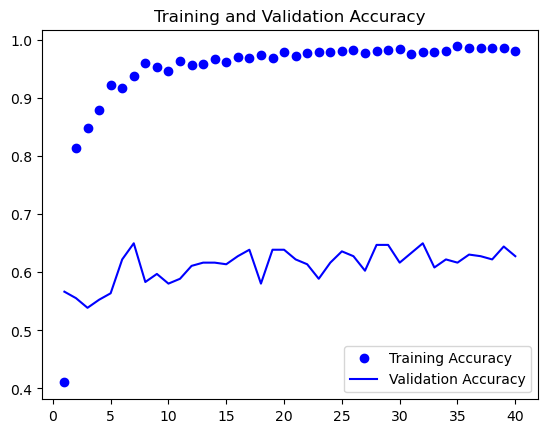

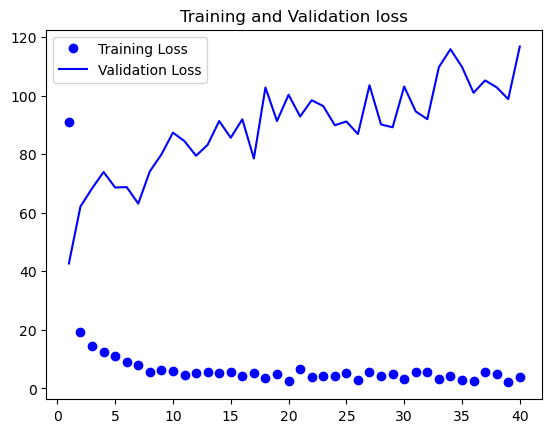

In [112]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1,len(accuracy)+ 1)
plt.plot(epochs, accuracy,"bo",label = "Training Accuracy")
plt.plot(epochs, val_accuracy,"b",label = "Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss,"bo",label = "Training Loss")
plt.plot(epochs, val_loss,"b",label = "Validation Loss")
plt.title("Training and Validation loss")
plt.legend()
plt.show()

In [128]:
test_model = keras.models.load_model("features_extraction.keras")
test_loss, test_acc = test_model.evaluate(test_features, test_labels)
print(f"Test accuracy: {test_acc:.3f}")

6/6 [==============================] - 0s 1ms/step - loss: 44.1871 - accuracy: 0.5944
Test accuracy: 0.594


In [ ]:
# Feature Extraction freezing the convolutional base.

In [130]:
conv_base = keras.applications.vgg16.VGG16(weights ="imagenet", include_top = False, input_shape=(180,180,3))
# Freeze the base.
conv_base.trainable = False

In [132]:
# Print the list of trainable weights before freezing.
conv_base.trainable = True

In [134]:
print("Number of trainable weights before freezing the base",
     len(conv_base.trainable_weights))

Number of trainable weights before freezing the base 26


In [136]:
# Print the list of trainable weights  after freezing.
conv_base.trainable = False

In [138]:
print("Number of trainable weights after freezing the base",
     len(conv_base.trainable_weights))

Number of trainable weights after freezing the base 0


In [140]:
#Let's now create a new model that chains together:
#A data augmentation stage
#The frozen convolutional base
#A dense classifier
data_augmentation = keras.Sequential(
[
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.2)
])

In [142]:
inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)  # Augmentations before model
x = keras.applications.vgg16.preprocess_input(x)
x = conv_base(x)  # VGG16 base
x = layers.Flatten()(x)
x = layers.Dense(256, activation="relu")(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(36, activation="softmax")(x)

model = keras.Model(inputs, outputs)

In [144]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="rmsprop", metrics=["accuracy"])

In [146]:
callbacks = [keras.callbacks.ModelCheckpoint(filepath='features_extraction_augmentation.keras',
                                             save_best_only = True,
                                             monitor = "val_loss")]

In [148]:
history = model.fit(train_dataset, epochs = 50,
                   validation_data = validation_dataset,
                   callbacks=callbacks)

Epoch 1/50
20/20 [==============================] - 37s 2s/step - loss: 14.5679 - accuracy: 0.1849 - val_loss: 3.7177 - val_accuracy: 0.2972
Epoch 2/50
20/20 [==============================] - 35s 2s/step - loss: 2.8918 - accuracy: 0.3357 - val_loss: 3.3232 - val_accuracy: 0.3667
Epoch 3/50
20/20 [==============================] - 34s 2s/step - loss: 2.7489 - accuracy: 0.4040 - val_loss: 3.6192 - val_accuracy: 0.3889
Epoch 4/50
20/20 [==============================] - 35s 2s/step - loss: 2.6407 - accuracy: 0.4603 - val_loss: 3.2292 - val_accuracy: 0.4583
Epoch 5/50
20/20 [==============================] - 35s 2s/step - loss: 2.4628 - accuracy: 0.4817 - val_loss: 3.0301 - val_accuracy: 0.4694
Epoch 6/50
20/20 [==============================] - 35s 2s/step - loss: 2.0952 - accuracy: 0.5484 - val_loss: 3.4974 - val_accuracy: 0.5417
Epoch 7/50
20/20 [==============================] - 36s 2s/step - loss: 2.0464 - accuracy: 0.6079 - val_loss: 3.3371 - val_accuracy: 0.5556
Epoch 8/50
20/20 [=

In [150]:
test_model = keras.models.load_model("features_extraction_augmentation.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

3/3 [==============================] - 4s 1s/step - loss: 2.8661 - accuracy: 0.5111
Test accuracy: 0.511


# Fine-tuning Pretrained Model

In [152]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

In [154]:
# Freeze all layers.
conv_base.trainable = True
for layer in conv_base.layers[:-4]:
    layer.trainable = False

In [156]:
# Fine-tune the model.
model.compile(
    loss="sparse_categorical_crossentropy",
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    metrics=["accuracy"]
)

In [158]:
callbacks = [keras.callbacks.ModelCheckpoint(filepath='fine_tuning.keras',
                                             save_best_only = True,
                                             monitor = "val_loss")]

In [160]:
history = model.fit(train_dataset, epochs = 30,
                   validation_data = validation_dataset,
                   callbacks= callbacks)

Epoch 1/30
20/20 [==============================] - 41s 2s/step - loss: 0.4785 - accuracy: 0.9095 - val_loss: 6.2336 - val_accuracy: 0.6417
Epoch 2/30
20/20 [==============================] - 39s 2s/step - loss: 0.4443 - accuracy: 0.9167 - val_loss: 6.0420 - val_accuracy: 0.6306
Epoch 3/30
20/20 [==============================] - 38s 2s/step - loss: 0.4426 - accuracy: 0.9048 - val_loss: 5.8066 - val_accuracy: 0.6472
Epoch 4/30
20/20 [==============================] - 39s 2s/step - loss: 0.4689 - accuracy: 0.9103 - val_loss: 5.6028 - val_accuracy: 0.6389
Epoch 5/30
20/20 [==============================] - 39s 2s/step - loss: 0.4794 - accuracy: 0.9103 - val_loss: 5.2718 - val_accuracy: 0.6361
Epoch 6/30
20/20 [==============================] - 39s 2s/step - loss: 0.3984 - accuracy: 0.9167 - val_loss: 5.1092 - val_accuracy: 0.6500
Epoch 7/30
20/20 [==============================] - 38s 2s/step - loss: 0.3898 - accuracy: 0.9119 - val_loss: 5.1167 - val_accuracy: 0.6444
Epoch 8/30
20/20 [==

In [162]:
test_model = keras.models.load_model("fine_tuning.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

3/3 [==============================] - 4s 995ms/step - loss: 4.7786 - accuracy: 0.6778
Test accuracy: 0.678


In [164]:
test_dataset = image_dataset_from_directory(
    new_base_dir / "test",
    image_size=(180, 180),
    batch_size=64)

Found 180 files belonging to 36 classes.


In [166]:
y_true = []
y_pred = []

for images, labels in test_dataset:
    preds = test_model.predict(images)
    preds_labels = np.argmax(preds, axis=1)
    y_true.extend(labels.numpy())
    y_pred.extend(preds_labels)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

2/2 [==============================] - 1s 407ms/step


In [168]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.60      0.75         5
           1       1.00      0.80      0.89         5
           2       0.83      1.00      0.91         5
           3       0.80      0.80      0.80         5
           4       1.00      1.00      1.00         5
           5       0.25      0.20      0.22         5
           6       1.00      0.80      0.89         5
           7       1.00      0.60      0.75         5
           8       0.42      1.00      0.59         5
           9       0.40      0.40      0.40         5
          10       1.00      0.80      0.89         5
          11       0.83      1.00      0.91         5
          12       0.56      1.00      0.71         5
          13       0.83      1.00      0.91         5
          14       0.67      0.40      0.50         5
          15       0.67      0.80      0.73         5
          16       1.00      1.00      1.00         5
          17       0.75    

In [170]:
print(classification_report(y_true, y_pred, digits=4))

              precision    recall  f1-score   support

           0     1.0000    0.6000    0.7500         5
           1     1.0000    0.8000    0.8889         5
           2     0.8333    1.0000    0.9091         5
           3     0.8000    0.8000    0.8000         5
           4     1.0000    1.0000    1.0000         5
           5     0.2500    0.2000    0.2222         5
           6     1.0000    0.8000    0.8889         5
           7     1.0000    0.6000    0.7500         5
           8     0.4167    1.0000    0.5882         5
           9     0.4000    0.4000    0.4000         5
          10     1.0000    0.8000    0.8889         5
          11     0.8333    1.0000    0.9091         5
          12     0.5556    1.0000    0.7143         5
          13     0.8333    1.0000    0.9091         5
          14     0.6667    0.4000    0.5000         5
          15     0.6667    0.8000    0.7273         5
          16     1.0000    1.0000    1.0000         5
          17     0.7500    

In [174]:
print(cm)

[[1 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 4 ... 0 0 0]
 ...
 [0 0 0 ... 1 0 1]
 [0 0 0 ... 0 2 0]
 [0 0 0 ... 1 0 1]]


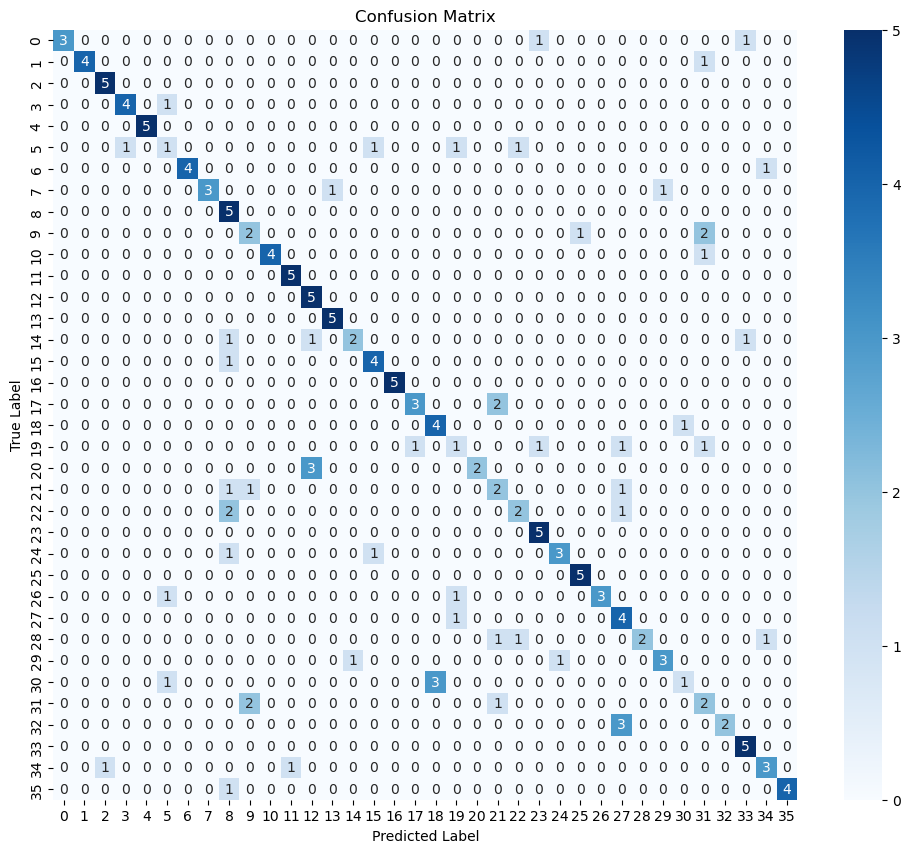

In [176]:
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12,10))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

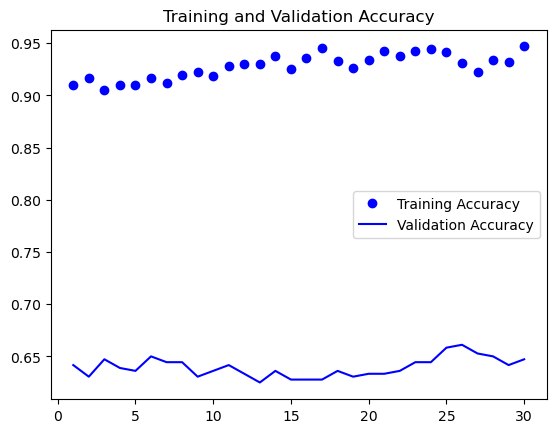

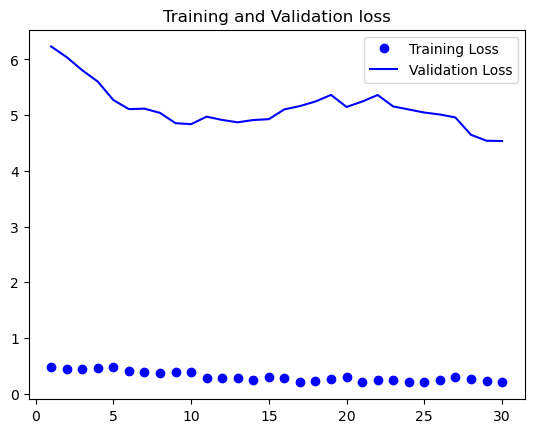

In [178]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1,len(accuracy)+ 1)
plt.plot(epochs, accuracy,"bo",label = "Training Accuracy")
plt.plot(epochs, val_accuracy,"b",label = "Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss,"bo",label = "Training Loss")
plt.plot(epochs, val_loss,"b",label = "Validation Loss")
plt.title("Training and Validation loss")
plt.legend()
plt.show()